In [1]:
import tensorflow_hub as hub
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [2]:
import os

## Pretrained Model

In [3]:
model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

In [4]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [5]:
content = "/content/drive/MyDrive/Neural style transfer/Content"
style = "/content/drive/MyDrive/Neural style transfer/Style"

In [6]:
os.listdir(content)

['face-1.png',
 'face-2.png',
 'face-3.png',
 'city-1.png',
 'city-2.png',
 'city-3.png',
 'animal-3.png',
 'animal-2.png',
 'animal-1.png']

In [7]:
os.listdir(style)

['animal-3.png',
 'animal-2.png',
 'animal-1.png',
 'face-1.png',
 'face-2.png',
 'face-3.png',
 'city-1.png',
 'city-2.png',
 'city-3.png']

In [8]:
animal_2 = load_img(content + "/animal-2.png")

In [9]:
animal_2.shape

TensorShape([1, 512, 418, 3])

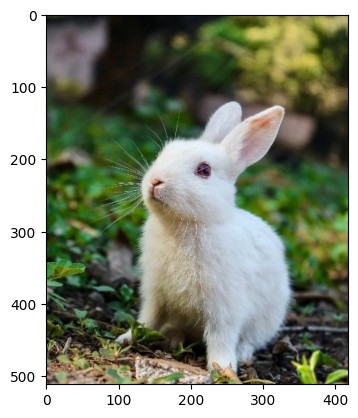

In [10]:
plt.imshow(np.squeeze(animal_2))
plt.show()

In [11]:
os.makedirs("/content/Output")

In [12]:
for file in os.listdir(content):
  content_image = load_img(content + "/" + file)
  style_image = load_img(style + "/" + file)
  stylized_image = model(tf.constant(content_image), tf.constant(style_image))[0]
  plt.imsave("/content/Output/" + file, np.squeeze(stylized_image))


In [13]:
length = len(os.listdir(content))

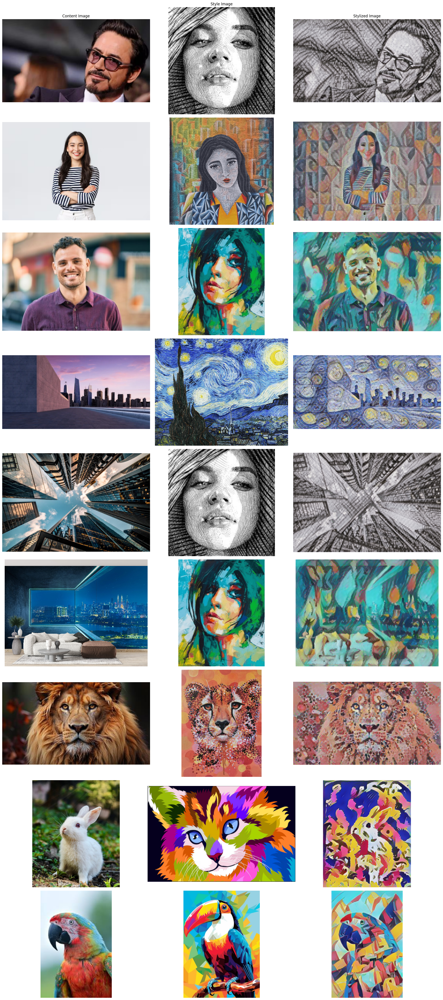

In [14]:
fig, axes = plt.subplots(length, 3, figsize=(20,length * 5))
axes[0, 0].set_title("Content Image")
axes[0, 1].set_title("Style Image")
axes[0, 2].set_title("Stylized Image")
for i, file in enumerate(os.listdir(content)):
  content_image = load_img(content + "/" + file)
  style_image = load_img(style + "/" + file)
  stylized_image = load_img("/content/Output/" + file)

  axes[i,0].imshow(np.squeeze(content_image))
  axes[i, 0].axis('off')

  axes[i,1].imshow(np.squeeze(style_image))
  axes[i, 1].axis('off')

  axes[i,2].imshow(np.squeeze(stylized_image))
  axes[i, 2].axis('off')
plt.tight_layout()
plt.show()

## VGG 19

In [15]:
animal_1 = load_img(content + "/animal-1.png")

In [16]:
x = tf.keras.applications.vgg19.preprocess_input(animal_1*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

574710816/574710816 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


TensorShape([1, 1000])

In [17]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


[('macaw', np.float32(0.8575162)),
 ('lorikeet', np.float32(0.14233096)),
 ('bee_eater', np.float32(9.812185e-05)),
 ('African_grey', np.float32(1.5733593e-05)),
 ('toucan', np.float32(1.1314286e-05))]

In [18]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [19]:
vgg.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, None, None, 64) │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, None, None,     │        73,856 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, None, None,     │       147,584 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, None, None,     │       295,168 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, None, None,     │     1,180,160 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │             

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

## Visualization

In [20]:
#Selecting the layers
content_layers = ['block1_conv1',
                  'block3_conv1',
                  'block5_conv1']

style_layers = ['block1_conv1',
                'block3_conv1',
                'block5_conv1']

In [21]:
from tensorflow.keras.preprocessing import image

content_model = tf.keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(layer).output for layer in content_layers])
style_model = tf.keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(layer).output for layer in style_layers])

# Load and preprocess the image
def load_and_process_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))  # Resize to 224x224
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return tf.keras.applications.vgg19.preprocess_input(img_array)

# Visualization function for random feature maps
def plot_random_activations(activations, layer_names, num_filters=9, grid_size=(3, 3)):
    for i, activation in enumerate(activations):
        layer_name = layer_names[i]

        # Ensure activation is 4D: (batch_size, height, width, num_channels)
        if len(activation.shape) == 3:
            activation = tf.expand_dims(activation, axis=0)  # Add batch dimension if missing

        num_filters_in_layer = activation.shape[-1]

        random_filter_indices = np.random.choice(num_filters_in_layer, num_filters, replace=False)

        height, width = activation.shape[1], activation.shape[2]

        display_grid = np.zeros((height * grid_size[0], width * grid_size[1]))

        for j, filter_index in enumerate(random_filter_indices):

            filter_activation = activation[0, :, :, filter_index].numpy()  # Convert EagerTensor to NumPy

            # Normalize the feature map
            filter_activation -= filter_activation.mean()
            filter_activation /= filter_activation.std()
            filter_activation *= 64
            filter_activation += 128
            filter_activation = np.clip(filter_activation, 0, 255).astype('uint8')

            # Calculate the position to place this filter in the grid
            row = j // grid_size[1]
            col = j % grid_size[1]

            # Place the filter in the grid
            display_grid[row * height:(row + 1) * height, col * width:(col + 1) * width] = filter_activation

        # Display the grid of activations for this layer
        plt.figure(figsize=(10, 10))
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.axis('off')
        plt.title(f"Filters of: {layer_name}")
        plt.show()

# Function to extract activations from the model
def get_activations(img_path, model_name):
    img_array = load_and_process_image(img_path)
    activations = model_name(img_array)
    return activations


In [22]:
style_layers

['block1_conv1', 'block3_conv1', 'block5_conv1']

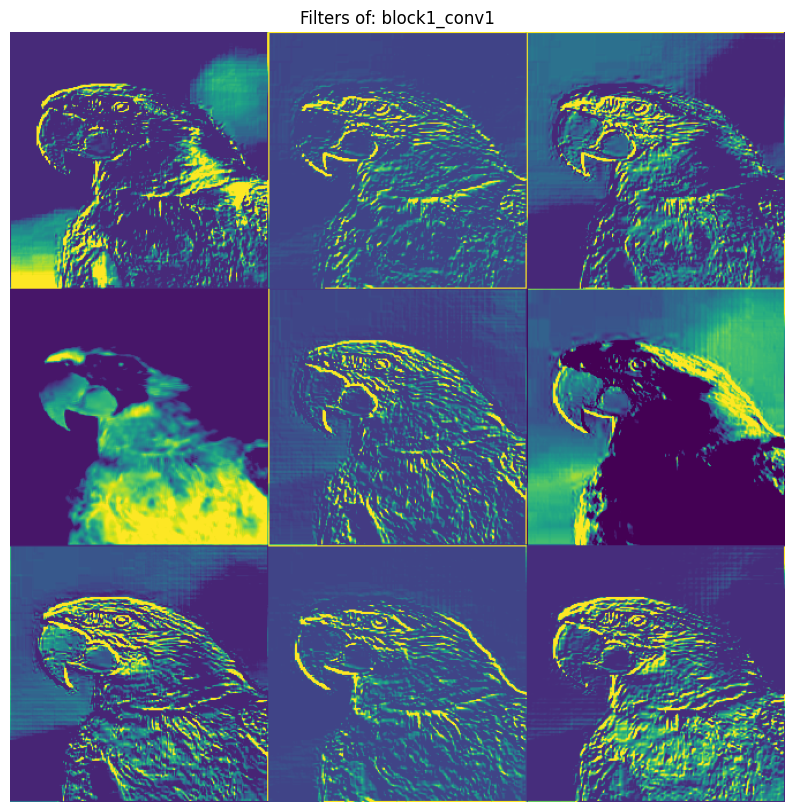

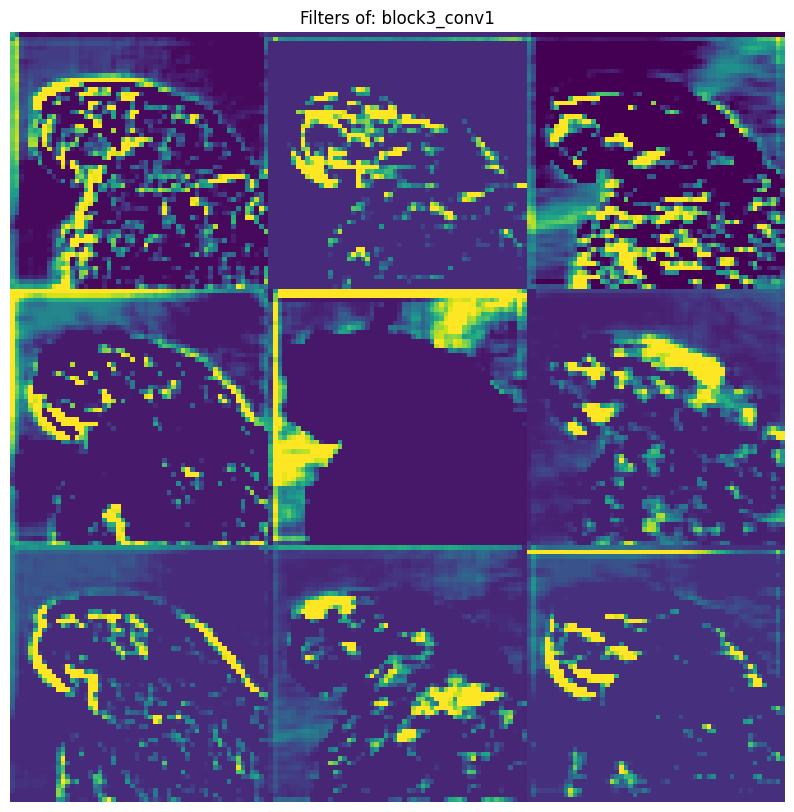

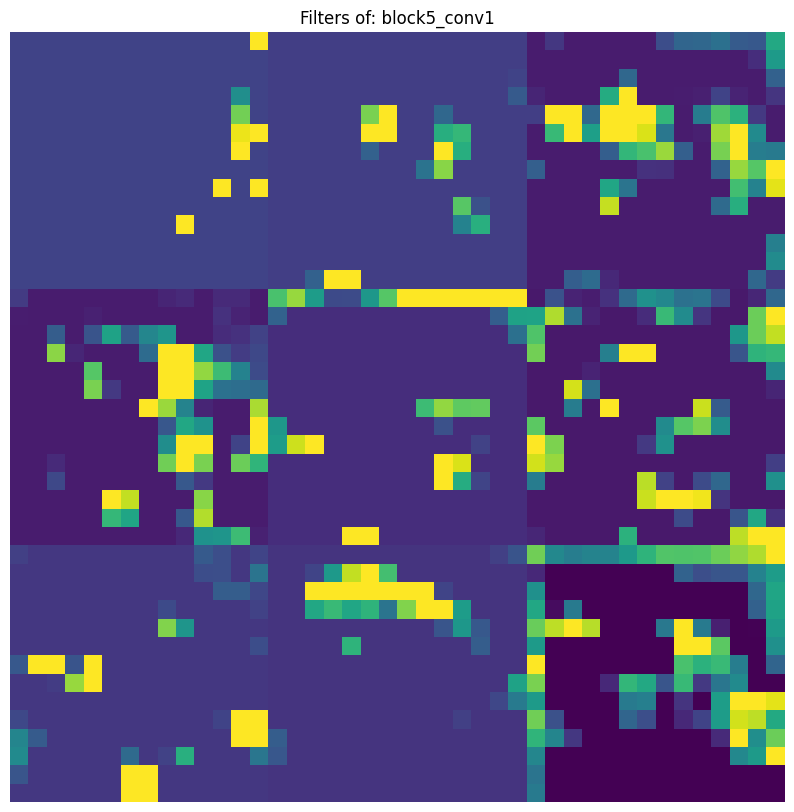

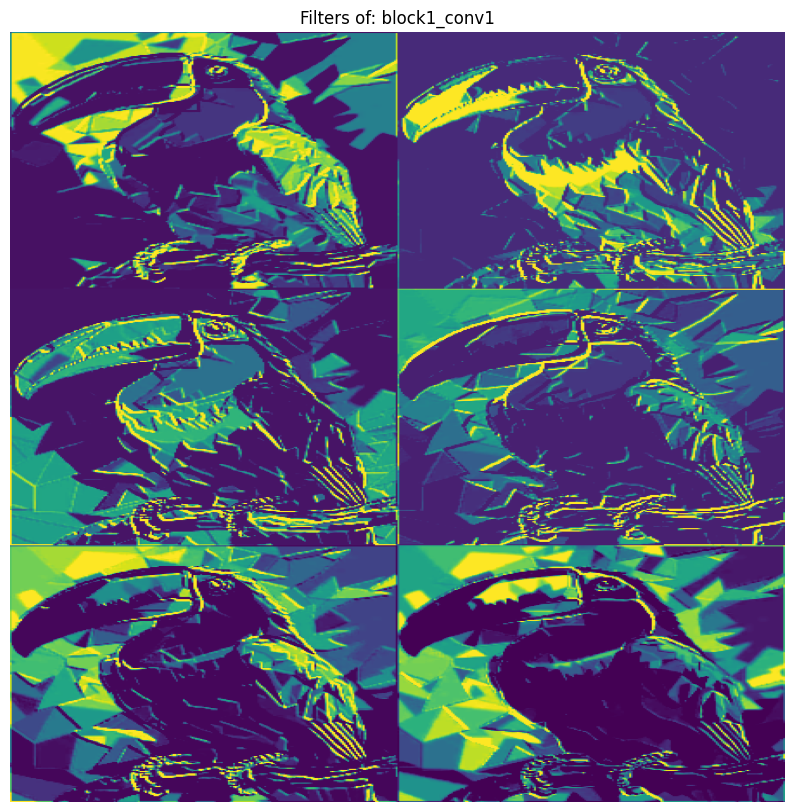

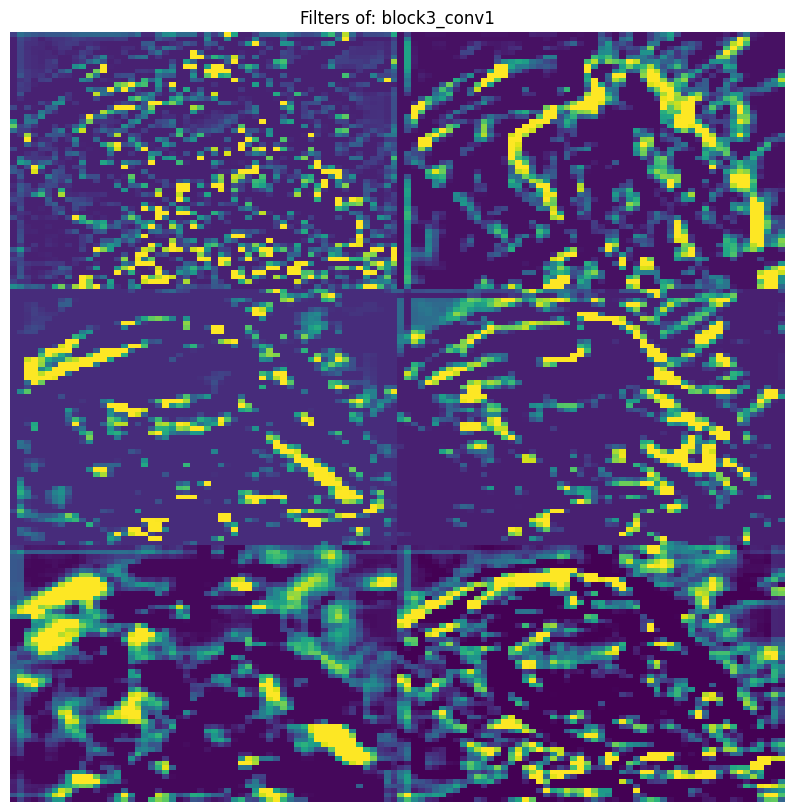

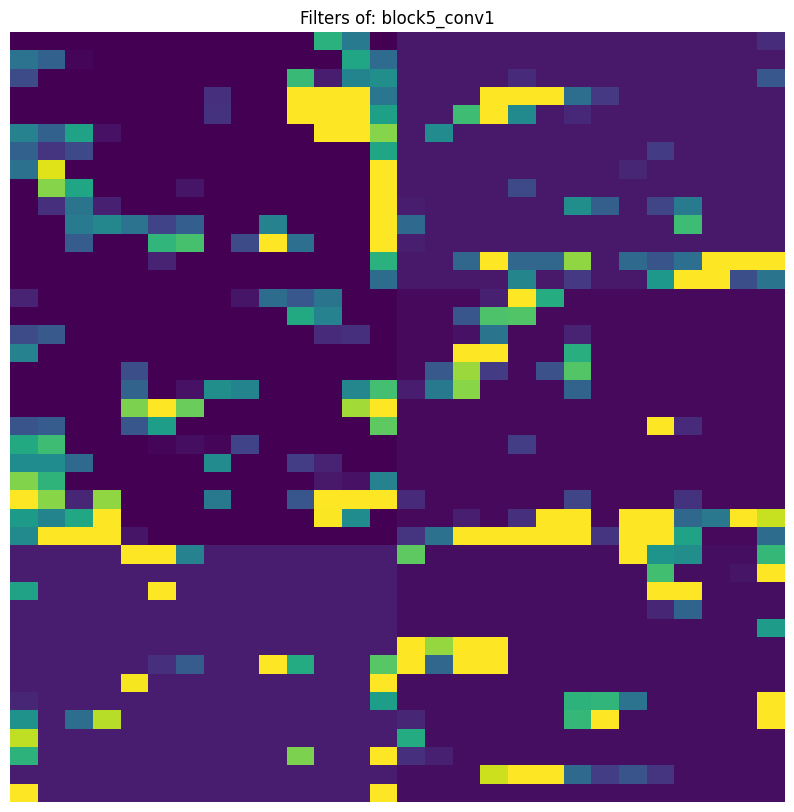

In [23]:
# Example usage
img_content = content + "/animal-1.png"
img_style = style + "/animal-1.png"


plot_random_activations(get_activations(img_content, content_model),
                        content_layers, num_filters=9,
                        grid_size=(3, 3))
plot_random_activations(get_activations(img_style, style_model),
                        style_layers, num_filters=6,
                        grid_size=(3, 2))